# LOW Light Enhancement using CNN
* [Loss Function](#Loss-Function)
* [Model Architecture](#Model-architecture)
* [Output](#Real-Life-Low-Light-images-from-internet)

In [ ]:
# !pip install --upgrade --no-cache-dir gdown
# !pip install tensorflow_addons
# !gdown --id 1EPdhjCO3Xp6aQMw4aUR-y7-Q85bO7pPq
# !unzip LOLdataset.zip -d ./data
# !rm LOLdataset.zip

In [1]:
import numpy as np # linear algebra
import os, random
import cv2 as cv
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import tensorflow_addons as tfa

from glob import glob

from tensorflow.keras import backend as K
# from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import add, Conv2D, Attention, Input, Concatenate, Reshape, concatenate, PReLU, Add, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from keras_self_attention import SeqSelfAttention 

%matplotlib inline

In [ ]:
np.random.seed(10)

Image_size = 128
Batch_size = 16
Max_IMG = 1300


def read_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image.set_shape([None, None, 3])
    image = tf.cast(image, dtype=tf.float32) / 255.0
    return image

@tf.function
def salt_and_pepper(image, pred_probability_salt=0.0005, pred_probability_pepper=0.0005):
    random_values = tf.random.uniform(shape=tf.shape(image))
    image = tf.where(random_values < pred_probability_salt, 1., image)
    image = tf.where(1 - random_values < pred_probability_pepper, 0., image)
    return image

@tf.function
def data_additive_speckle_noise(image, pred_probability_range=[0.0, 0.0005]):
    pred_probability = tf.random.uniform((), *pred_probability_range)
    sample = tf.random.uniform(tf.shape(image))
    noisy_image = tf.where(sample <= pred_probability, tf.zeros_like(image), image)
    noisy_image = tf.where(sample >= (1. - pred_probability), 1.*tf.ones_like(image), noisy_image)
    return noisy_image

def data_additive_gaussian_noise(image, stddev_range=[0.005, 0.0095]):
    stddev = tf.random.uniform((), *stddev_range)
    noise = tf.random.normal(tf.shape(image), stddev=stddev)
    noisy_image = tf.clip_by_value(image + noise, 0, 255)
    return noisy_image

def data_poisson(image):
    vals = 30
    vals = 2 ** tf.math.ceil(tf.experimental.numpy.log2(vals))
    noisy = tf.experimental.numpy.random.data_poisson(image * vals) / float(vals)
    return noisy

def data_agu_random_crop(low_light_image, enhanced_image):
    low_light_image_shape = tf.shape(low_light_image)[:2]
    lol_width = tf.random.uniform(
        shape=(), maxval=low_light_image_shape[1] - Image_size + 1, dtype=tf.int32
    )
    lol_HR = tf.random.uniform(
        shape=(), maxval=low_light_image_shape[0] - Image_size + 1, dtype=tf.int32
    )
    enhanced_width = lol_width
    enhanced_height = lol_HR
    lol_image_cropped = low_light_image[
        lol_HR : lol_HR + Image_size, lol_width : lol_width + Image_size
    ]
    enhanced_image_cropped = enhanced_image[
        enhanced_height : enhanced_height + Image_size, enhanced_width : enhanced_width + Image_size
    ]
    lol_image_cropped = salt_and_pepper(lol_image_cropped)
    lol_image_cropped = data_additive_gaussian_noise(lol_image_cropped)
    return lol_image_cropped, enhanced_image_cropped


def load_data(low_light_image_path, enhanced_image_path):
    low_light_image = read_image(low_light_image_path)
    enhanced_image = read_image(enhanced_image_path)
    low_light_image, enhanced_image = data_agu_random_crop(low_light_image, enhanced_image)
    return low_light_image, enhanced_image


def get_dataset(low_light_images, enhanced_images):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images, enhanced_images))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(Batch_size, drop_remainder=True)
    return dataset


train_low_light_images = sorted(glob("./data/LOLdataset/our485/low/*"))[:Max_IMG]
train_enhanced_images = sorted(glob("./data/LOLdataset/our485/high/*"))[:Max_IMG]

val_low_light_images = sorted(glob("./data/LOLdataset/our485/low/*"))[Max_IMG:]
val_enhanced_images = sorted(glob("./data/LOLdataset/our485/high/*"))[Max_IMG:]

test_low_light_images = sorted(glob("./data/LOLdataset/eval15/low/*"))
test_enhanced_images = sorted(glob("./data/LOLdataset/eval15/high/*"))


train_dataset = get_dataset(train_low_light_images, train_enhanced_images)
val_dataset = get_dataset(val_low_light_images, val_enhanced_images)


print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)

In [7]:
@tf.function
def pixel_br_SSIM(y_true, y_pred):
    SSIM_loss = loss_ssim(tf.expand_dims(y_pred[:,:,:,0], -1), tf.expand_dims(y_true[:,:,:,0], -1))+loss_ssim(tf.expand_dims(y_pred[:,:,:,1], -1), tf.expand_dims(y_true[:,:,:,1], -1)) + loss_ssim(tf.expand_dims(y_pred[:,:,:,2], -1), tf.expand_dims(y_true[:,:,:,2], -1))
    return SSIM_loss/3

@tf.function
def PSNR(y_true, y_pred):
    max_pixel = 1.0
    return tf.image.psnr(y_true, y_pred, max_val=max_pixel)

@tf.function
def pixel_br_mae(y_true, y_pred):
    return K.mean(K.abs(y_pred[:,:,:,:3] - y_true[:,:,:,:3]))

@tf.function
def bright_mse(y_true, y_pred):
    return K.mean((y_pred[:,:,:,:3] - y_true[:,:,:,:3])**2)

@tf.function
def pixel_br_AB(y_true, y_pred):
            return K.abs(K.mean(y_true[:,:,:,:3])-K.mean(y_pred[:,:,:,:3]))

@tf.function
def pixel_br_PSNR(y_true, y_pred):
    mse = K.mean((K.abs(y_pred[:,:,:,:3] - y_true[:,:,:,:3])) ** 2)
    max_num = 1.0
    psnr = 10 * log10(max_num ** 2 / mse)
    return psnr

@tf.function
def smooth_L1_Hubber_loss(y_true, y_pred):
    return tf.keras.losses.huber(y_true[:,:,:,:3], y_pred[:,:,:,:3])

@tf.function
def gaussi_fspecial(size, sigma):
    x_getdata, y_getdata = np.mgrid[-size//2 + 1:size//2 + 1, -size//2 + 1:size//2 + 1]

    x_getdata = np.expand_dims(x_getdata, axis=-1)
    x_getdata = np.expand_dims(x_getdata, axis=-1)

    y_getdata = np.expand_dims(y_getdata, axis=-1)
    y_getdata = np.expand_dims(y_getdata, axis=-1)

    x = tf.constant(x_getdata, dtype=tf.float32)
    y = tf.constant(y_getdata, dtype=tf.float32)

    g_last = tf.exp(-((x**2 + y**2)/(2.0*sigma**2)))
    return g_last / tf.reduce_sum(g_last)

@tf.function
def loss_ssim(image1, image2, cs_map=False, mean_metric=True, size=11, sigma=1.5):
    window = gaussi_fspecial(size, sigma)
    K_1st = 0.01
    K_2nd = 0.03
    L = 1 
    C1 = (K_1st*L)**2
    C2 = (K_2nd*L)**2
    mu1 = tf.nn.conv2d(image1, window, strides=[1,1,1,1], padding='VALID')
    mu2 = tf.nn.conv2d(image2, window, strides=[1,1,1,1],padding='VALID')
    mu1_sq = mu1*mu1
    mu2_sq = mu2*mu2
    mu1_mu2 = mu1*mu2
    sigma1_sq = tf.nn.conv2d(image1*image1, window, strides=[1,1,1,1],padding='VALID') - mu1_sq
    sigma2_sq = tf.nn.conv2d(image2*image2, window, strides=[1,1,1,1],padding='VALID') - mu2_sq
    sigma12 = tf.nn.conv2d(image1*image2, window, strides=[1,1,1,1],padding='VALID') - mu1_mu2
    if cs_map:
        value = (((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*
                            (sigma1_sq + sigma2_sq + C2)),
                        (2.0*sigma12 + C2)/(sigma1_sq + sigma2_sq + C2))
    else:
        value = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*
                            (sigma1_sq + sigma2_sq + C2))

    if mean_metric:
        value = tf.reduce_mean(value)
    return value

@tf.function
def loss_ms_ssim(image1, image2, mean_metric=True, level=5):
    weight = tf.constant([0.0448, 0.2856, 0.3001, 0.2363, 0.1333], dtype=tf.float32)
    mssim = []
    mcs = []
    for l in range(level):
        ssim_map, cs_map = loss_ssim(image1, image2, cs_map=True, mean_metric=False)
        mssim.append(tf.reduce_mean(ssim_map))
        mcs.append(tf.reduce_mean(cs_map))
        filtered_im1 = tf.nn.avg_pool(image1, [1,2,2,1], [1,2,2,1], padding='SAME')
        filtered_im2 = tf.nn.avg_pool(image2, [1,2,2,1], [1,2,2,1], padding='SAME')
        image1 = filtered_im1
        image2 = filtered_im2

    mssim = tf.stack(mssim, axis=0)
    mcs = tf.stack(mcs, axis=0)

    value = (tf.reduce_prod(mcs[0:level-1]**weight[0:level-1])*
                                    (mssim[level-1]**weight[level-1]))

    if mean_metric:
        value = tf.reduce_mean(value)
    return value

# Loss Function

In [3]:
@tf.function
def my_loss(y_true, y_pred):
    SSIM_loss = loss_ssim(tf.expand_dims(y_pred[:, :, :, 0], -1),tf.expand_dims(y_true[:, :, :, 0], -1)) + loss_ssim(
        tf.expand_dims(y_pred[:, :, :, 1], -1), tf.expand_dims(y_true[:, :, :, 1], -1)) + loss_ssim(
        tf.expand_dims(y_pred[:, :, :, 2], -1), tf.expand_dims(y_true[:, :, :, 2], -1))
# #     VGG_loss = K.mean(K.abs(y_pred[:, :, :, 3:19] - y_pred[:, :, :, 19:35]))
#     vector_target2 = tf.reshape(vgg.conv5_1, [-1, tf.shape(vgg.conv5_1)[1] * tf.shape(vgg.conv5_1)[2], 512])
#     vector_output2 = tf.reshpe(vgg1.conv5_1, [-1, tf.shape(vgg.conv5_1)[1] * tf.shape(vgg.conv5_1)[2], 512])
#     style_loss =  tl.cost.mean_squared_error(tf.matmul(vector_target2, vector_target2, adjoint_a=True)/(50*75*256), 
#                                              tf.matmul(vector_output2, vector_output2, adjoint_a=True)/(50*75*256), is_mean=True)
#     percent = 0.5305025
    percent = 0.6
    index = int(Image_size * Image_size * percent - 1)
    gray1 = 0.39 * y_pred[:, :, :, 0] + 0.5 * y_pred[:, :, :, 1] + 0.11 * y_pred[:, :, :, 2]
    gray = tf.reshape(gray1, [-1, Image_size * Image_size])
    gray_sort = tf.nn.top_k(-gray, Image_size * Image_size)[0]
    Y_U = gray_sort[:, index]
    Y_U = tf.expand_dims(tf.expand_dims(Y_U, -1), -1)
    final_mask = tf.cast(gray1 <= Y_U, tf.float32)
    final_mask_1st = tf.expand_dims(final_mask, -1)
    final_mask = tf.concat([final_mask_1st, final_mask_1st, final_mask_1st], -1)

    low_fake_clean = tf.multiply(final_mask, y_pred[:, :, :, :3])
    high_fake_clean = tf.multiply(1 - final_mask, y_pred[:, :, :, :3])
    low_clean = tf.multiply(final_mask, y_true[:, :, :, :])
    high_clean = tf.multiply(1 - final_mask, y_true[:, :, :, :])
    Region_loss = K.mean(K.abs(low_fake_clean - low_clean) * 4 + K.abs(high_fake_clean - high_clean))

    
    smooth_l1_loss = tf.keras.losses.huber(y_true, y_pred)

#     loss =  3 - SSIM_loss  + smooth_l1_loss + Region_loss + VGG_loss/3.
    loss =  3 - SSIM_loss  + smooth_l1_loss + Region_loss 
    return loss

In [4]:
count = 0
def get_plotted_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
        
    # plt.savefig("./"+str(count)+ ".png")
    plt.show()


def do_inference(original_image):
    image = tf.keras.preprocessing.image.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output = model.predict(image)
    output_image = output[0] * 255.0
    output_image = output_image.clip(0, 255)
    output_image = output_image.reshape(
        (np.shape(output_image)[0], np.shape(output_image)[1], 3)
    )
    output_image = Image.fromarray(np.uint8(output_image))
    original_image = Image.fromarray(np.uint8(original_image))
    return output_image

def print_result(enhanced_image, original_image):
    
    pil_autoc = ImageOps.autocontrast(original_image)
    original_image = np.asarray(original_image)
    enhanced_image = np.asarray(enhanced_image)
    pil_autoc = np.asarray(pil_autoc)
    
    print("PSNR of CNN Enhanced image: ", tf.image.psnr(enhanced_image, original_image, max_val=255).numpy())
#     print("PSNR of PIL Autocontrast image: ", tf.image.psnr(pil_autoc, original_image, max_val=255).numpy())
    print("SSIM of CNN Enhanced image: ", tf.image.ssim(enhanced_image, original_image, max_val=255).numpy())
#     print("SSIM of PIL Autocontrast image: ", tf.image.ssim(pil_autoc, original_image, max_val=255).numpy())


In [5]:
def Final(enhanced_image):
    l_a_b= cv.cvtColor(np.asarray(enhanced_image), cv.COLOR_BGR2LAB)

    l, a, b = cv.split(l_a_b)


    apply_clahe = cv.createCLAHE(clipLimit=1.0, tileGridSize=(1, 1))
    cl = apply_clahe.apply(l)

    limg = cv.merge((cl,a,b))

    final = cv.cvtColor(limg, cv.COLOR_LAB2BGR)
    final = Image.fromarray(final)
    return final

# Model architecture

In [12]:
model = tf.keras.models.load_model('models/lolEnhanceb6_0.6.h5', custom_objects={"PSNR": PSNR, "my_loss": my_loss, "smooth_L1_loss":smooth_L1_Hubber_loss, 
                                                                        "bright_psnr":pixel_br_PSNR, "bright_SSIM":pixel_br_SSIM, 
                                                                        "bright_AB":pixel_br_AB})
# new_model = tf.keras.models.load_model('models/lolEnhance.h5', custom_objects={"PSNR": PSNR, "my_loss": my_loss, "pixel_br_mae":pixel_br_mae, 
#                                                                            "bright_mse":bright_mse, "smooth_L1_Hubber_loss":smooth_L1_Hubber_loss, "pixel_br_PSNR":pixel_br_PSNR, 
#                                                                            "pixel_br_SSIM":pixel_br_SSIM, "pixel_br_AB":pixel_br_AB})

# Check its architecture
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 tf.image.adjust_brightness (TF  (None, None, None,   0          ['input_1[0][0]']                
 OpLambda)                      3)                                                                
                                                                                                  
 weight_normalization (WeightNo  (None, None, None,   1825       ['tf.image.adjust_brightness[0][0
 rmalization)                   32)                              ]']                          

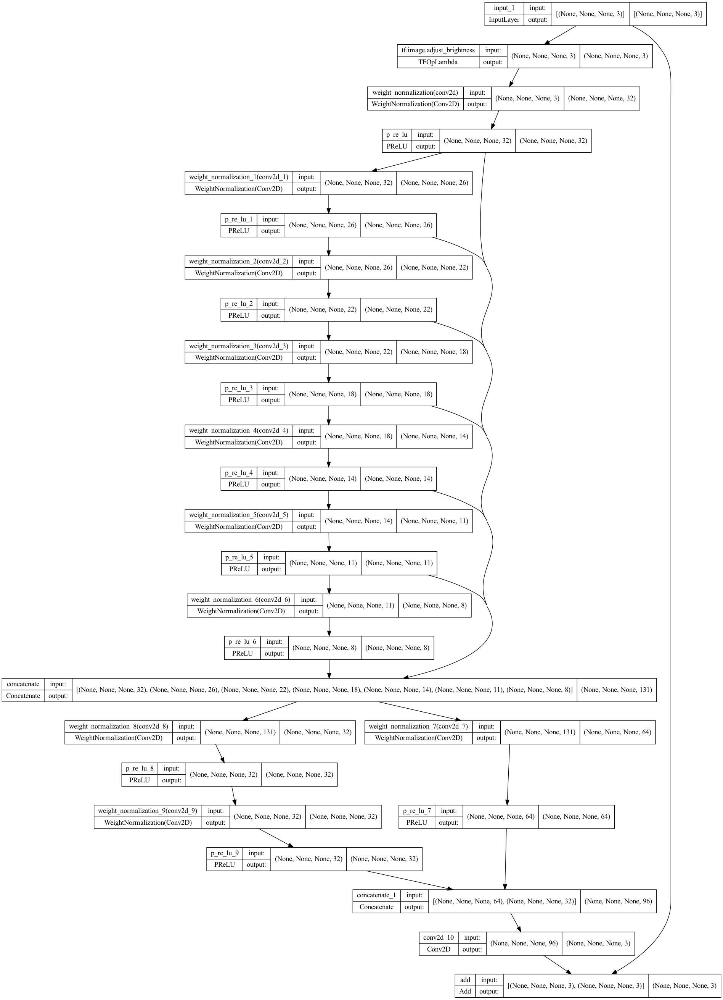

In [13]:
from tensorflow.keras.utils import plot_model
plot_model(model,to_file='model_.png',show_shapes=True, show_layer_names=True)
from IPython.display import Image
Image(retina=True, filename='model_.png')

# Images from Test LOL dataset

In [14]:
from PIL import Image, ImageOps

low_light_image: ./data/LOLdataset/eval15/low/1.png,  enh_light_image: ./data/LOLdataset/eval15/high/1.png


2022-07-05 16:29:48.606049: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-07-05 16:29:49.106059: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


PSNR of CNN Enhanced image:  20.999462
SSIM of CNN Enhanced image:  0.795557


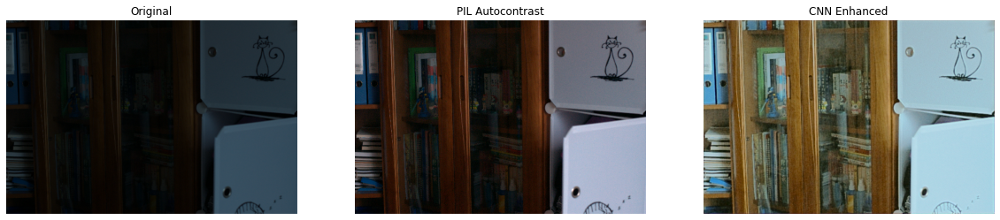

low_light_image: ./data/LOLdataset/eval15/low/111.png,  enh_light_image: ./data/LOLdataset/eval15/high/111.png
PSNR of CNN Enhanced image:  19.868078
SSIM of CNN Enhanced image:  0.7979313


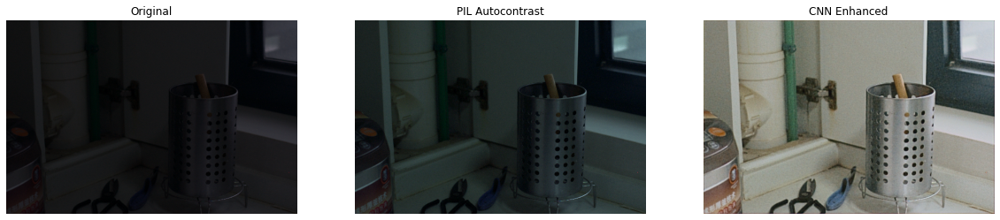

low_light_image: ./data/LOLdataset/eval15/low/146.png,  enh_light_image: ./data/LOLdataset/eval15/high/146.png
PSNR of CNN Enhanced image:  24.729832
SSIM of CNN Enhanced image:  0.8000202


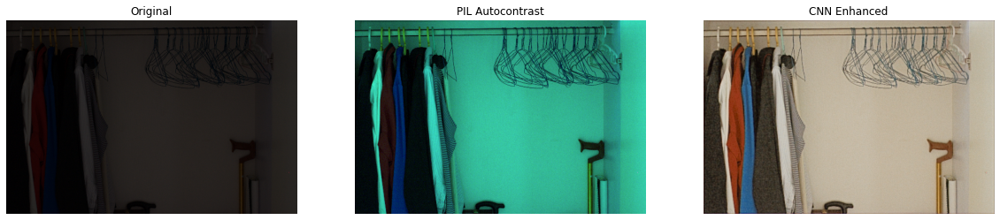

low_light_image: ./data/LOLdataset/eval15/low/179.png,  enh_light_image: ./data/LOLdataset/eval15/high/179.png
PSNR of CNN Enhanced image:  13.788847
SSIM of CNN Enhanced image:  0.6335561


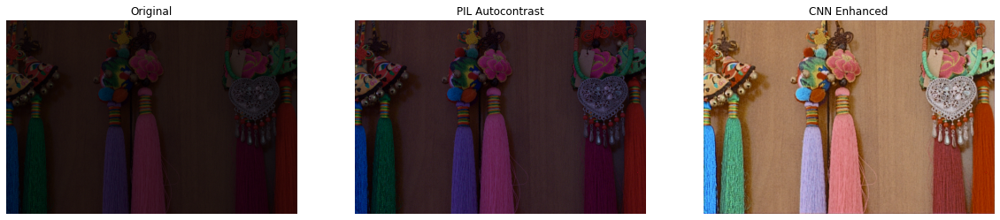

low_light_image: ./data/LOLdataset/eval15/low/22.png,  enh_light_image: ./data/LOLdataset/eval15/high/22.png
PSNR of CNN Enhanced image:  25.322546
SSIM of CNN Enhanced image:  0.81335247


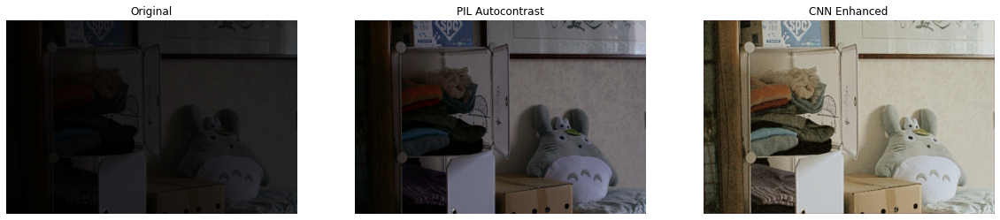

low_light_image: ./data/LOLdataset/eval15/low/23.png,  enh_light_image: ./data/LOLdataset/eval15/high/23.png
PSNR of CNN Enhanced image:  15.10784
SSIM of CNN Enhanced image:  0.6857662


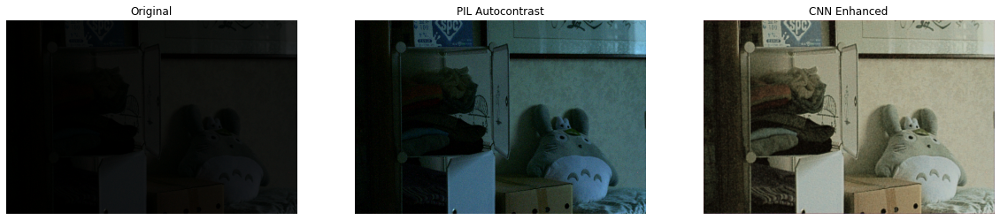

low_light_image: ./data/LOLdataset/eval15/low/493.png,  enh_light_image: ./data/LOLdataset/eval15/high/493.png
PSNR of CNN Enhanced image:  17.351263
SSIM of CNN Enhanced image:  0.5545533


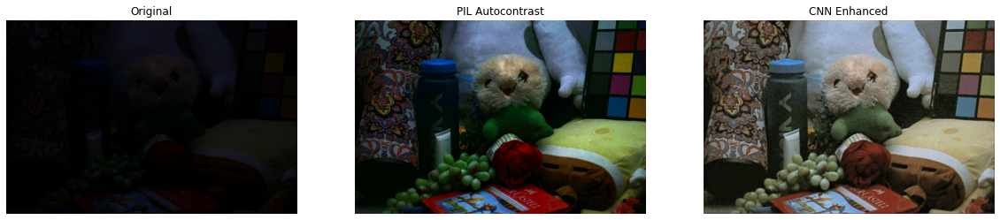

low_light_image: ./data/LOLdataset/eval15/low/547.png,  enh_light_image: ./data/LOLdataset/eval15/high/547.png
PSNR of CNN Enhanced image:  19.668743
SSIM of CNN Enhanced image:  0.7271704


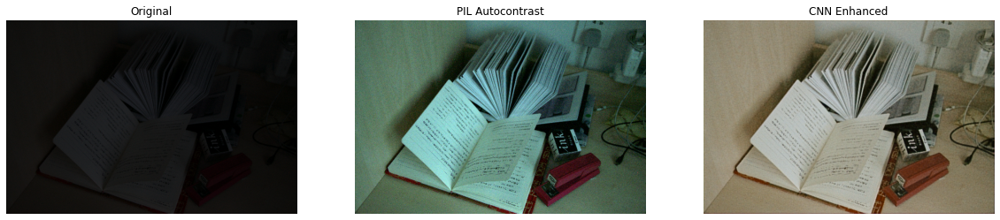

low_light_image: ./data/LOLdataset/eval15/low/55.png,  enh_light_image: ./data/LOLdataset/eval15/high/55.png
PSNR of CNN Enhanced image:  13.7460375
SSIM of CNN Enhanced image:  0.66681975


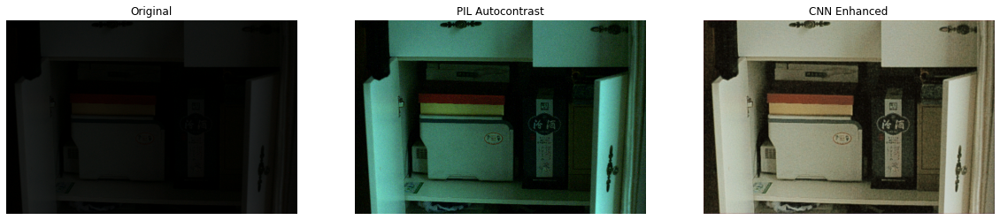

low_light_image: ./data/LOLdataset/eval15/low/665.png,  enh_light_image: ./data/LOLdataset/eval15/high/665.png
PSNR of CNN Enhanced image:  21.720873
SSIM of CNN Enhanced image:  0.6797011


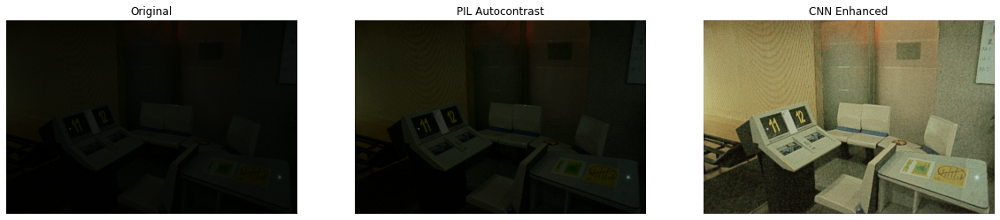

low_light_image: ./data/LOLdataset/eval15/low/669.png,  enh_light_image: ./data/LOLdataset/eval15/high/669.png
PSNR of CNN Enhanced image:  21.460798
SSIM of CNN Enhanced image:  0.7380574


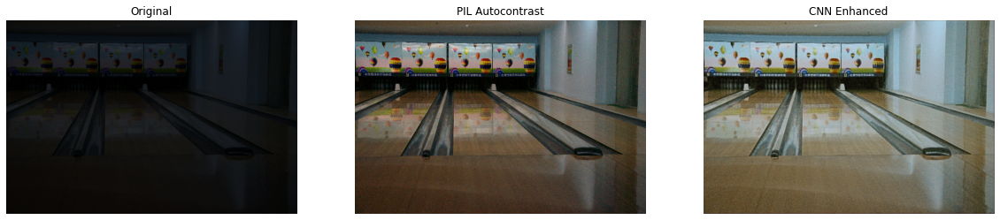

low_light_image: ./data/LOLdataset/eval15/low/748.png,  enh_light_image: ./data/LOLdataset/eval15/high/748.png
PSNR of CNN Enhanced image:  20.485193
SSIM of CNN Enhanced image:  0.7398662


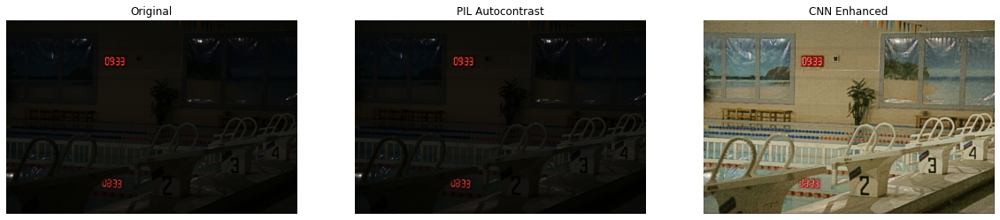

low_light_image: ./data/LOLdataset/eval15/low/778.png,  enh_light_image: ./data/LOLdataset/eval15/high/778.png
PSNR of CNN Enhanced image:  20.392353
SSIM of CNN Enhanced image:  0.68492216


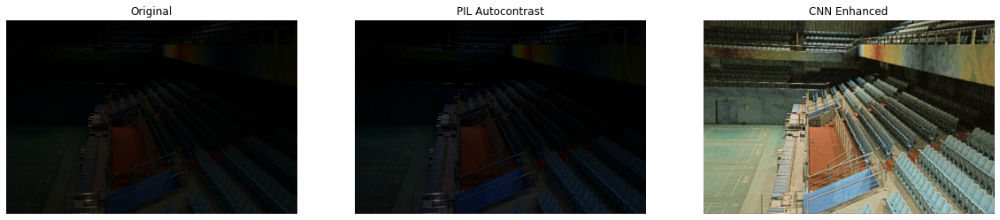

low_light_image: ./data/LOLdataset/eval15/low/780.png,  enh_light_image: ./data/LOLdataset/eval15/high/780.png
PSNR of CNN Enhanced image:  15.978326
SSIM of CNN Enhanced image:  0.5887848


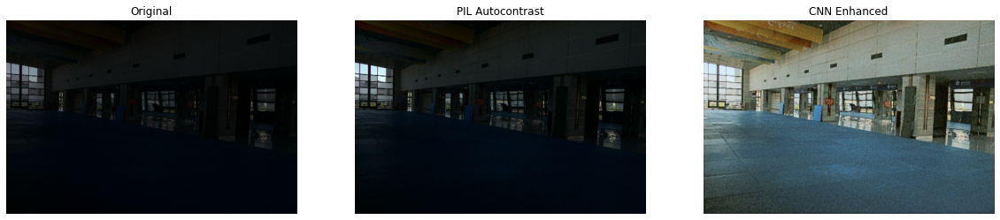

low_light_image: ./data/LOLdataset/eval15/low/79.png,  enh_light_image: ./data/LOLdataset/eval15/high/79.png
PSNR of CNN Enhanced image:  17.830587
SSIM of CNN Enhanced image:  0.79884064


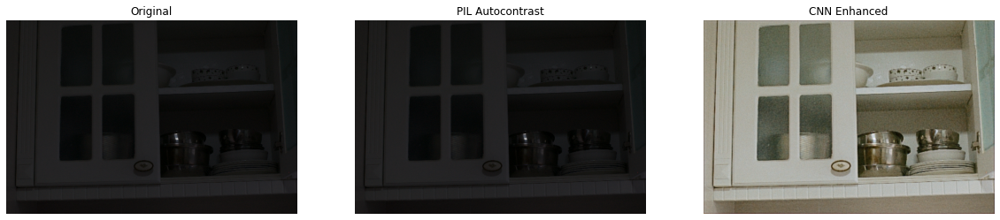

Avg. PSNR of reconstuctions images is 19.2301
Avg. SSIM of reconstructions is 0.7137


In [15]:
total_test_psnr = 0
total_test_ssim = 0

from PIL import Image, ImageOps
for low_light_image, enh_light_image in zip(test_low_light_images, test_enhanced_images):
    print(f"low_light_image: {low_light_image},  enh_light_image: {enh_light_image}")
    original_image = Image.open(low_light_image)
    enh_l_image = Image.open(enh_light_image)
#     enh_l_image = np.asarray(enh_l_image)
    enhanced_image = do_inference(original_image)
    enhanced_image = Final(enhanced_image)
    
    print_result(enh_l_image, enhanced_image)
    
    enh_l_image = np.asarray(enh_l_image)
    enhanced_image = np.asarray(enhanced_image)
    
    total_test_psnr +=  tf.image.psnr(enh_l_image, enhanced_image, max_val=255).numpy()
    total_test_ssim +=  tf.image.ssim(enh_l_image, enhanced_image, max_val=255).numpy()
    
    get_plotted_results(
        [original_image, ImageOps.autocontrast(original_image), enhanced_image],
        ["Original", "PIL Autocontrast", "CNN Enhanced"],
        (20, 12),
    )
    count += 1

print("Avg. PSNR of reconstuctions images is %.4f" % (total_test_psnr / 15))
print("Avg. SSIM of reconstructions is %.4f" % (total_test_ssim / 15))

2022-06-19 02:03:52.694675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


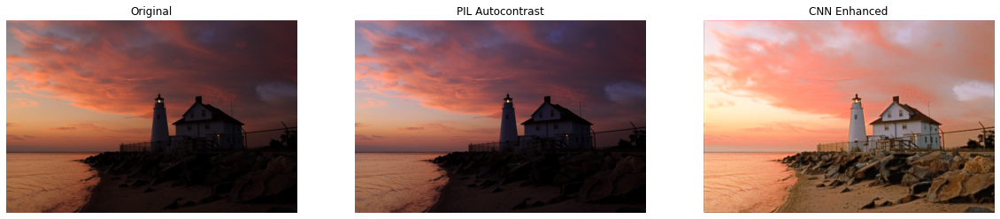

In [ ]:
original_image = Image.open('Lighthouse_under.png')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/Lighthouse.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

# Real Life Low Light images from internet

In [ ]:
# model = tf.keras.models.load_model('data/lolEnhanceb16max900.h5', custom_objects={"PSNR": PSNR, "my_loss": my_loss, "smooth_L1_Hubber_loss":smooth_L1_Hubber_loss, 
#                                                                         "pixel_br_PSNR":pixel_br_PSNR, "pixel_br_SSIM":pixel_br_SSIM, 
#                                                                         "pixel_br_AB":pixel_br_AB})

2022-06-19 02:03:54.893927: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


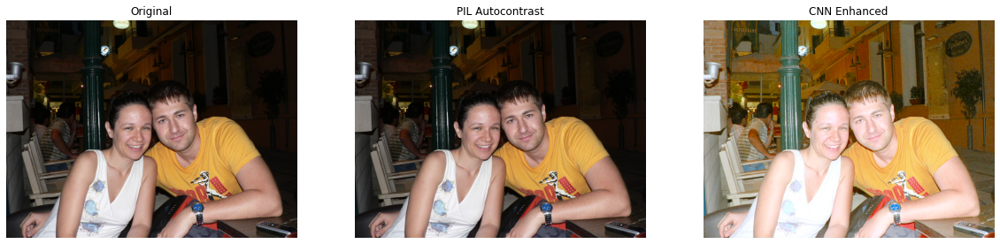

In [ ]:
original_image = Image.open('P1030700.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/couple1.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

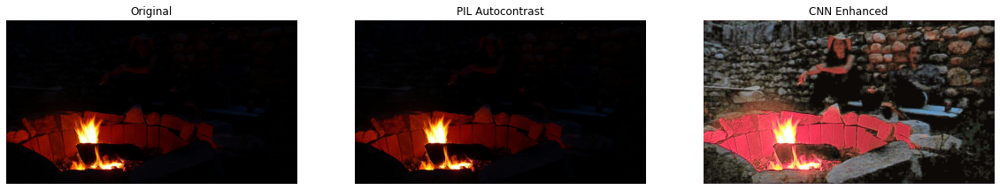

In [ ]:
original_image = Image.open('fire.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

enhanced_image.save(f"Out/fire_.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

# Images taken from Smartphone Camera (With noise)

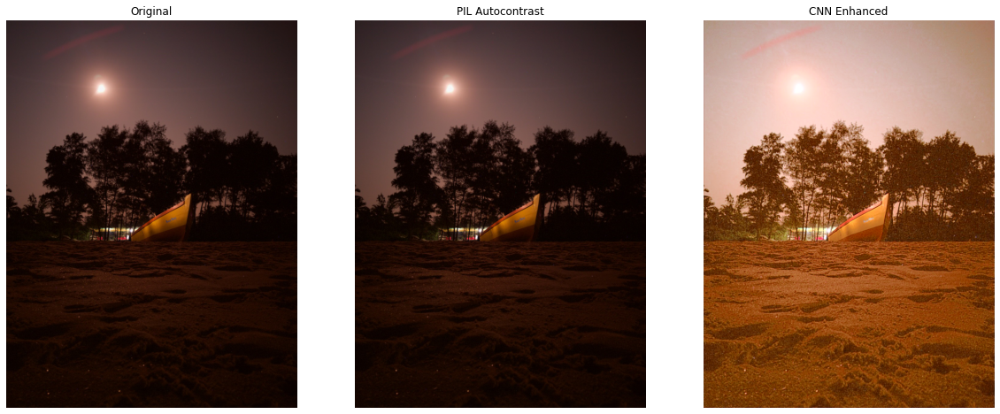

In [ ]:
original_image = Image.open('boat.jpeg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/boa_t.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

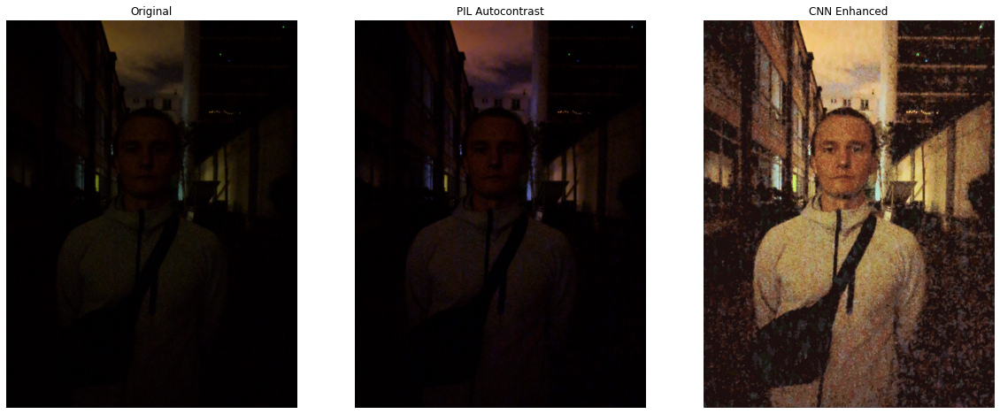

In [ ]:
original_image = Image.open('port.jpeg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/port_.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

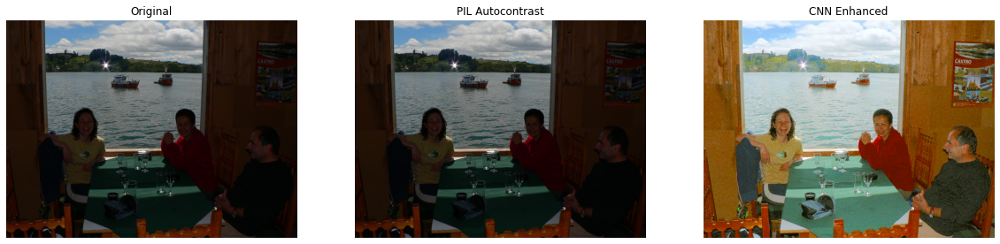

In [ ]:
original_image = Image.open('data/dataset/P1020044.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/dine.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

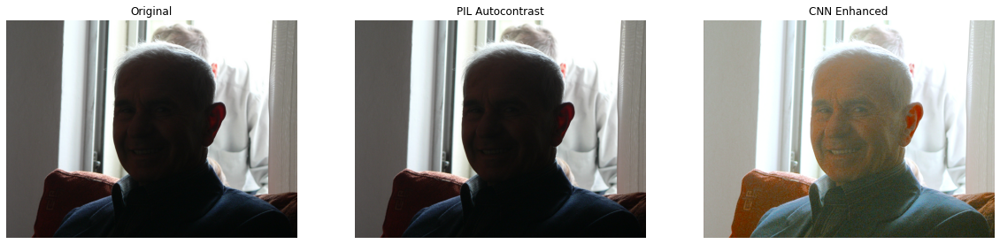

In [ ]:
original_image = Image.open('data/dataset/P1020150.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/oldman.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

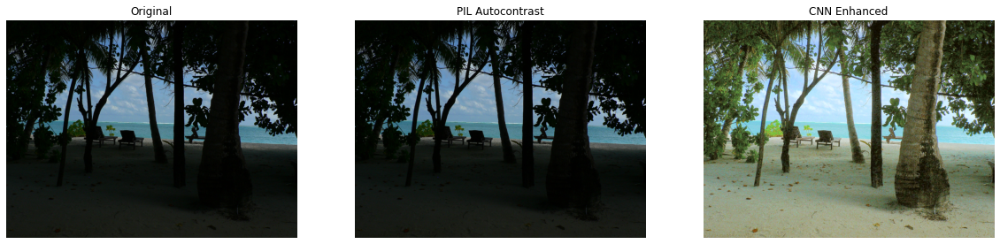

In [ ]:
original_image = Image.open('data/dataset/P1090828.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/sea.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

In [ ]:
!ls data/dataset

P1000205.jpg P1010157.jpg P1010523.jpg P1010860.jpg P1020741.jpg P1090828.jpg
P1000333.jpg P1010234.jpg P1010676.jpg P1010880.jpg P1030700.jpg P1090905.jpg
P1000511.jpg P1010426.jpg P1010732.jpg P1020044.jpg P1040134.jpg P9220346.jpg
P1010062.jpg P1010520.jpg P1010815.jpg P1020150.jpg P1090815.jpg


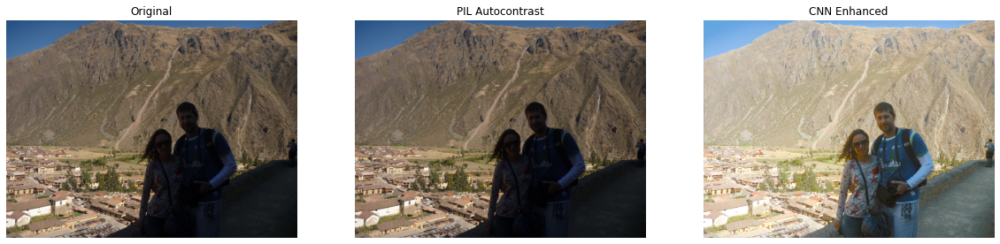

In [ ]:
original_image = Image.open('data/dataset/P1010234.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/mountain.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

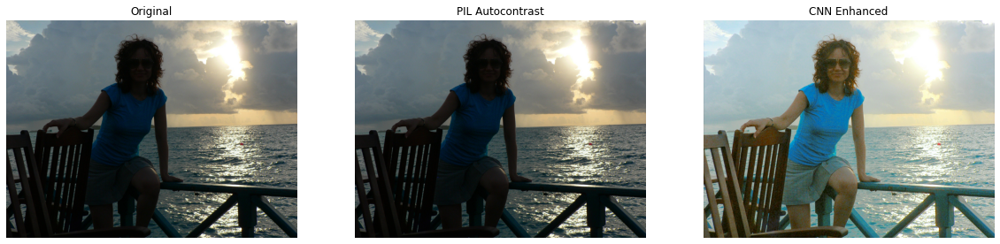

In [ ]:
original_image = Image.open('data/dataset/P1090905.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/end.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

2022-07-05 16:30:23.389358: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


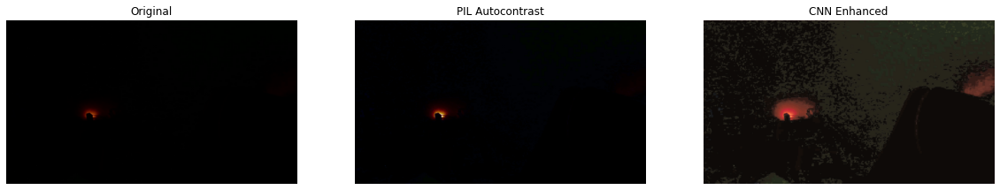

In [16]:
original_image = Image.open('data/001.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/001.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

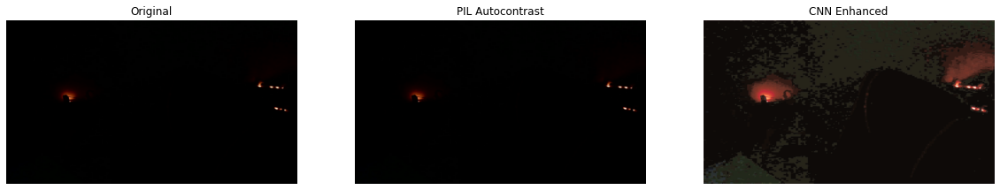

In [17]:
original_image = Image.open('data/002.jpg')
enhanced_image = do_inference(original_image)
enhanced_image = Final(enhanced_image)

# print_result(original_image, enhanced_image)
enhanced_image.save(f"Out/002.png", "png")
get_plotted_results(
      [original_image, ImageOps.autocontrast(original_image), enhanced_image],
      ["Original", "PIL Autocontrast", "CNN Enhanced"],
      (20, 12),
  )

In [18]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import math

UBIT = "rgupta24"

#Importing the images
mountain1 = cv2.imread("Out/001.png")
mountain2 = cv2.imread("Out/002.png")

### PART 1

#Converting images to gray-scale
grayMountain1 = cv2.cvtColor(mountain1, cv2.COLOR_BGR2GRAY)
grayMountain2 = cv2.cvtColor(mountain2, cv2.COLOR_BGR2GRAY)

#Creating SIFT object
sift = cv2.xfeatures2d.SIFT_create()

#Finding keypoints and descriptors for Mountain images
keyp1, desc1 = sift.detectAndCompute(grayMountain1, None)
keyp2, desc2 = sift.detectAndCompute(grayMountain2, None)

#Drawing keypoints for Mountain images
keyImage1 = cv2.drawKeypoints(grayMountain1, keyp1, np.array([]), (0, 0, 255))
keyImage2 = cv2.drawKeypoints(grayMountain2, keyp2, np.array([]), (0, 0, 255))

cv2.imwrite('task1_sift1.jpg', keyImage1)
cv2.imwrite('task1_sift2.jpg', keyImage2)

### PART 2

#Brute-Force matching with SIFT descriptors
brutef = cv2.BFMatcher()

#Matching the keypoints with k-nearest neighbor (with k=2)
matches = brutef.knnMatch(desc1, desc2, k=2)

goodMatch = []
#Performing ratio test to find good matches
for m, n in matches:
	if m.distance < 0.75*n.distance:
		goodMatch.append(m)

#Drawing good matches
matchImage = cv2.drawMatches(mountain1, keyp1, mountain2, keyp2, goodMatch, np.array([]), (0, 0, 255), flags=2)

cv2.imwrite('task1_matches_knn.jpg', matchImage)

### PART 3

#Getting source and destination points
srce_pts = np.float32([ keyp1[m.queryIdx].pt for m in goodMatch]).reshape(-1, 1, 2)
dest_pts = np.float32([ keyp2[m.trainIdx].pt for m in goodMatch]).reshape(-1, 1, 2)

#Finding Homography Matrix and mask
homographyMat, mask = cv2.findHomography(srce_pts, dest_pts, cv2.RANSAC, 5.0)
print(homographyMat)

### PART 4

#Converting the mask to a list
matchesMask = mask.ravel().tolist()

h, w = mountain1.shape[:2]
pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1, 1, 2)

matchIndex = []
for i in range(len(matchesMask)):
	if (matchesMask[i]):
		matchIndex.append(i)

matchArray = []
for i in matchIndex:
	matchArray.append(goodMatch[i])

#Finding 10 random matches using inliers
np.random.seed(sum([ord(c) for c in UBIT]))
randomMatch = np.random.choice(matchArray, 10, replace=False)

#Defining draw parameters
draw_params = dict(matchColor=(0, 0, 255),
                   singlePointColor=None,
                   flags=2)

#Drawing the match image for 10 random points
matchImage = cv2.drawMatches(mountain1, keyp1, mountain2, keyp2, randomMatch, None, **draw_params)

cv2.imwrite('task1_matches.jpg', matchImage)

### PART 5

h1, w1 = mountain2.shape[:2]
h2, w2 = mountain1.shape[:2]
pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
pts2_ = cv2.perspectiveTransform(pts2, homographyMat)
pts = np.concatenate((pts1, pts2_), axis=0)

#Finding the minimum and maximum coordinates
[xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
[xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
t = [-xmin, -ymin]

#Translating
Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])

#Warping the first image on the second image using Homography Matrix
result = cv2.warpPerspective(mountain1, Ht.dot(homographyMat), (xmax-xmin, ymax-ymin))
result[t[1]:h1+t[1], t[0]:w1+t[0]] = mountain2

cv2.imwrite('task1_pano.jpg', result)

[ WARN:0@6634.350] global /Users/xperience/actions-runner/_work/opencv-python/opencv-python/opencv_contrib/modules/xfeatures2d/misc/python/shadow_sift.hpp (15) SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736



systemMemory: 16.00 GB
maxCacheSize: 5.33 GB

[[ 5.91401204e-01 -6.95148496e-03  6.62927166e+00]
 [-2.89766213e-01  9.10021451e-01  7.53443107e+00]
 [-6.02570330e-04  2.46325158e-04  1.00000000e+00]]


True